In [1]:
import os
import cv2
import json
import glob
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from tqdm import tqdm
from natsort import natsorted

In [2]:
with open(os.path.join(os.getcwd(), "data_path_config.json"), "r") as f:
    config = json.load(f)

config

{'raw_data': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact',
 'processed_data': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact',
 'videos': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact\\videos',
 'visual_features': 'D:\\Projects\\masters_diploma\\data\\raw\\EmoReact\\visual_features',
 'datasets': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets',
 'datasets_videos': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\videos',
 'datasets_visual_features': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\visual_features',
 'images': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\images',
 'datasets_images': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\images',
 'audio': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\audio',
 'datasets_audio': 'D:\\Projects\\masters_diploma\\data\\processed\\EmoReact\\datasets\\audio',
 'audio_216k': 'D:\\Projects\\masters_diplo

In [3]:
def select_major_emotion(emotion_vector: np.array) -> np.array:
    """
    Returns the major emotion based on significance while retaining the original order.

    :param emotion_vector: List of binary values representing emotions.
    :return: A new binary vector with only the major emotion set to 1.
    """

    # Original order of emotions
    original_order = ["Curiosity", "Uncertainty", "Excitement", "Happiness",
                     "Surprise", "Disgust", "Fear", "Frustration"]

    # New order of significance
    new_order = ["Happiness", "Excitement", "Disgust", "Fear", "Frustration",
                 "Surprise", "Curiosity", "Uncertainty"]

    # Extract emotions from initial vector
    indicated_emotions = [original_order[i] for i, e in enumerate(emotion_vector) if e == 1]

    # Determine the most significant emotion from the new order
    for emotion in new_order:
        if emotion in indicated_emotions:
            major = emotion
            break

    # Create and return the new vector based on original order
    return np.array([1 if emotion == major else 0 for emotion in original_order])

In [4]:
emotion_dict = {
    0: "Curiosity",
    1: "Uncertainty",
    2: "Excitement",
    3: "Happiness",
    4: "Surprise",
    5: "Disgust",
    6: "Fear",
    7: "Frustration"
}

In [5]:
def visualize_emotion(img_path, emotion_name):
    img = plt.imread(img_path)

    plt.figure(figsize=(8, 7))
    plt.axis('off')
    plt.grid(False)

    plt.imshow(img)
    plt.title(f"Emotion: *{emotion_name}*")
    plt.show()

# Train analysis

In [6]:
dataset_name = "Train"
df = pd.read_csv(os.path.join(config["datasets_images"], "train.csv"))

# Drop cases, where there are no detected emotions
df = df[df.iloc[:, 1:-1].eq(1).any(axis=1)]

emotions_agg = []
for el_id in range(len(df.index)):
    _labels_list = np.array(df.iloc[el_id, 1:-1].values, dtype=int)
    _label = select_major_emotion(emotion_vector=_labels_list)
    emotions_agg.append(np.argmax(_label))

df["major_emotion"] = emotions_agg
df

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,3.3333,3
1,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.3333,3
4,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.6667,3
6,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.0000,3
7,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,5.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
427,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,1,0,0,0,4.6667,3
428,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,1,0,0,0,5.6667,3
429,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,0,0,0,0,5.3333,3
430,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.3333,0


### Curiosity

In [7]:
emotion_num = 0

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
9,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,2.6667,0
10,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.6667,0
33,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.3333,0
34,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,2.6667,0
80,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.3333,0
130,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.0000,0
144,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,3.3333,0
152,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.6667,0
173,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,3.3333,0
198,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.3333,0


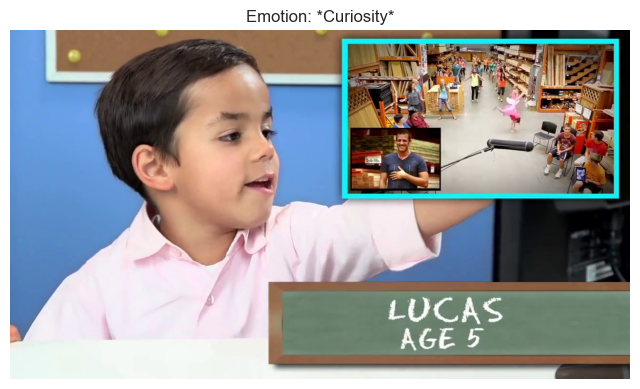

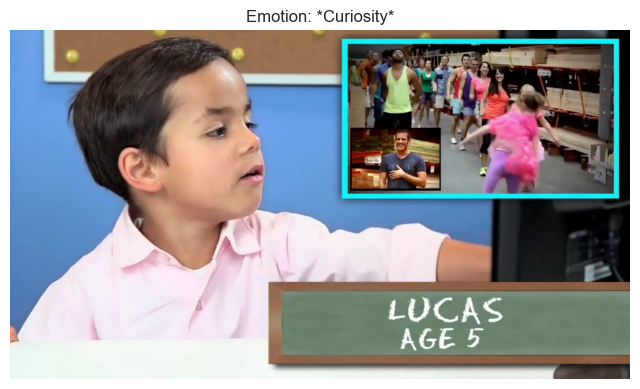

In [8]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[8], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Uncertainty

In [9]:
emotion_num = 1

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
11,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,2.6667,1
51,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
170,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
226,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
252,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
257,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
262,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.0000,1
295,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.3333,1
356,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.0000,1
383,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.3333,1


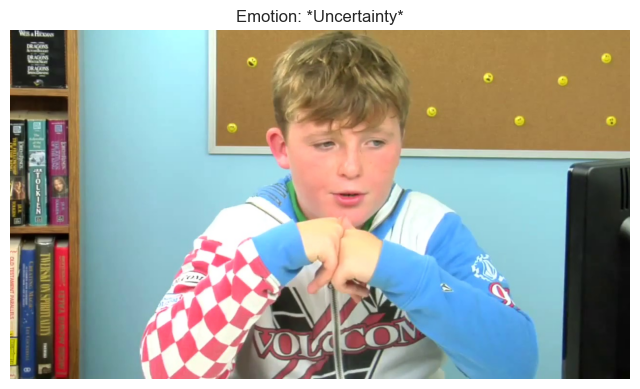

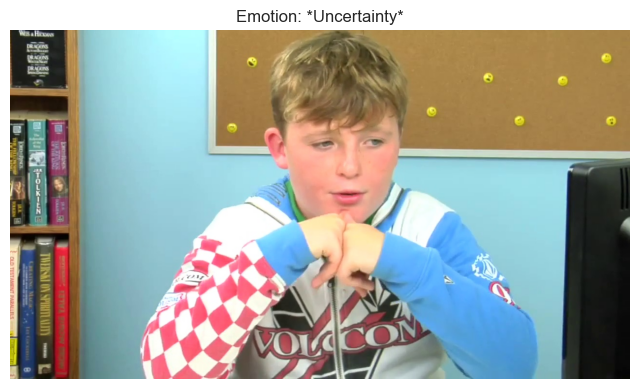

In [10]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[1], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Excitement

In [11]:
emotion_num = 2

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
8,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,0,1,0,0,0,5.0000,2
20,D:\Projects\masters_diploma\data\processed\Emo...,0,1,1,0,0,0,0,0,2.6667,2
27,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,1,0,1,2.3333,2
30,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.6667,2
50,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,2.0000,2
67,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.0000,2
70,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.6667,2
73,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,1,3.6667,2
84,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,0,1,0,0,1,3.0000,2
87,D:\Projects\masters_diploma\data\processed\Emo...,0,1,1,0,1,1,1,1,1.6667,2


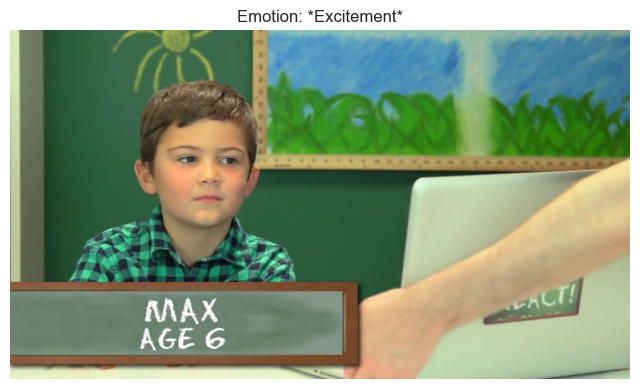

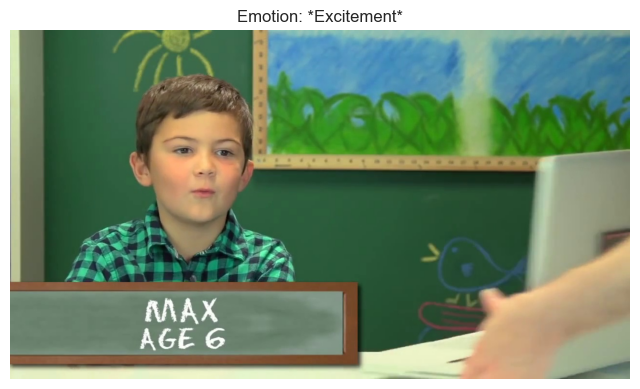

In [12]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Happiness

In [13]:
emotion_num = 3

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,3.3333,3
1,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.3333,3
4,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.6667,3
6,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.0000,3
7,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,5.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
425,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,1,1,0,0,0,5.6667,3
427,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,1,0,0,0,4.6667,3
428,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,1,0,0,0,5.6667,3
429,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,0,0,0,0,5.3333,3


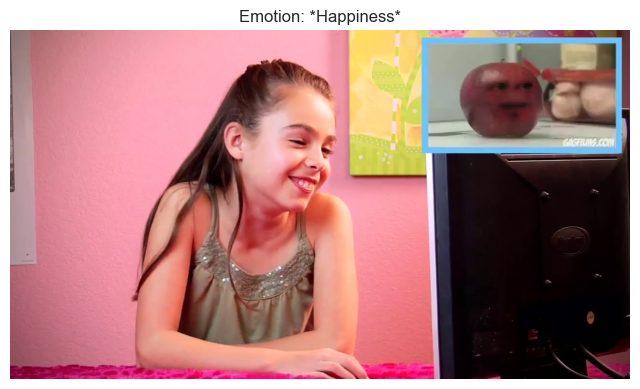

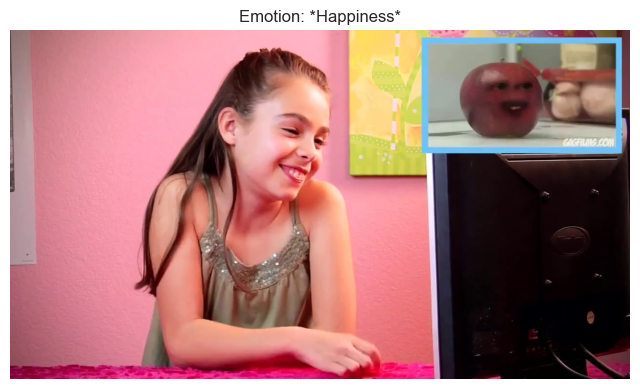

In [14]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[5], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Surprise

In [15]:
emotion_num = 4

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
86,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,3.0000,4
237,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,3.3333,4
240,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,3.6667,4
271,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,3.0000,4
340,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,4.0000,4
349,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,3.3333,4
360,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,0,3.3333,4
362,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,0,3.3333,4
364,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,2.6667,4
376,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,4.0000,4


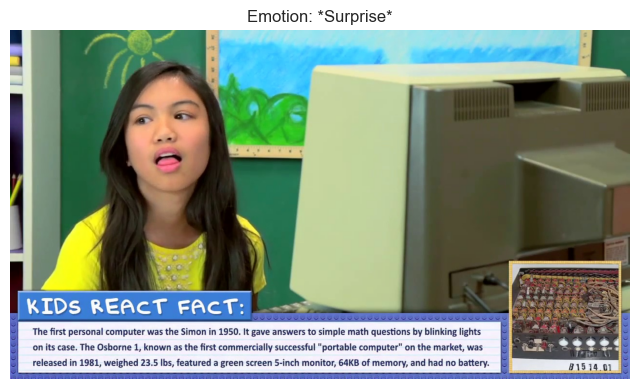

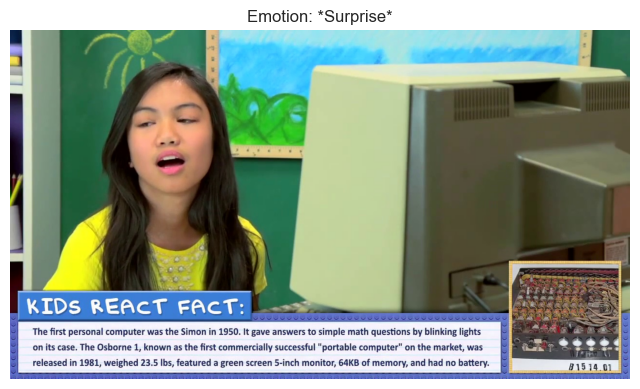

In [16]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[2], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Disgust

In [17]:
emotion_num = 5

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
45,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,1,2.0000,5
49,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,1,2.6667,5
54,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,3.0000,5
61,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.3333,5
64,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.6667,5
88,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,1,0,0,3.6667,5
90,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,1,0,0,2.6667,5
91,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.3333,5
94,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.6667,5
95,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.3333,5


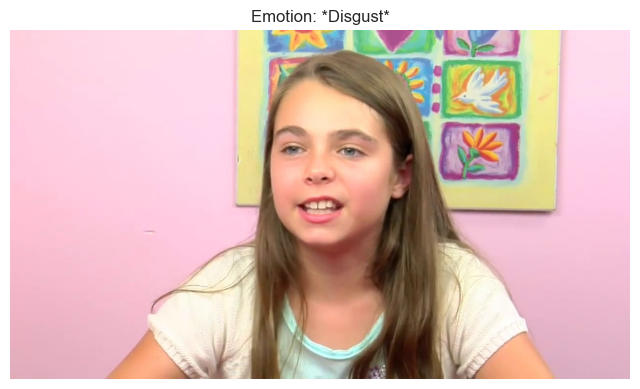

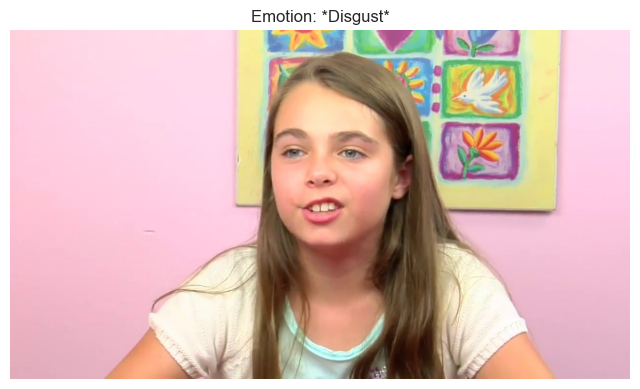

In [18]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[2], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Fear

In [60]:
emotion_num = 6

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
89,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,1,0,3.3333,6
215,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,1,0,3.3333,6
257,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,1,0,4.3333,6


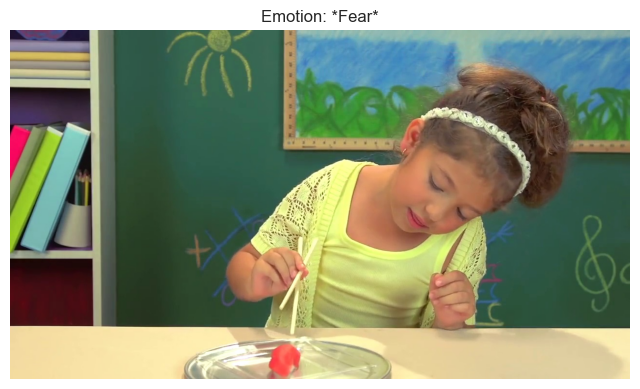

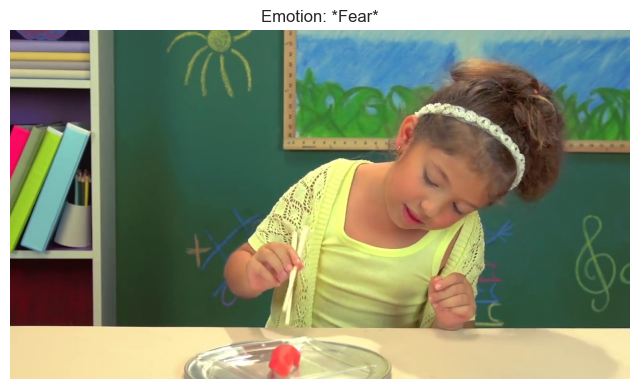

In [65]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[2], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Frustration

In [67]:
emotion_num = 7

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
148,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,1,3.6667,7
193,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.6667,7
266,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,1,2.3333,7
270,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,1,3.0000,7
271,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,1,2.6667,7
272,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,2.3333,7
273,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.3333,7
283,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,1,2.0000,7
285,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.0000,7
286,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,1,3.0000,7


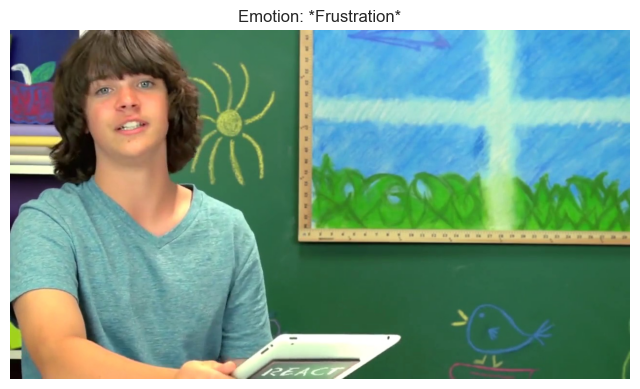

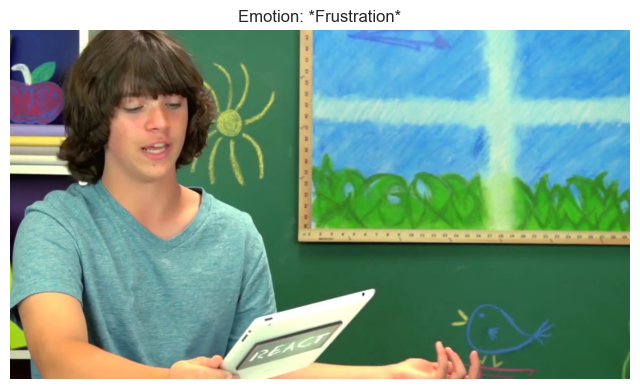

In [79]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[2], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

# Validation analysis

In [23]:
dataset_name = "Validation"
df = pd.read_csv(os.path.join(config["datasets_images"], "val.csv"))

# Drop cases, where there are no detected emotions
df = df[df.iloc[:, 1:-1].eq(1).any(axis=1)]

emotions_agg = []
for el_id in range(len(df.index)):
    _labels_list = np.array(df.iloc[el_id, 1:-1].values, dtype=int)
    _label = select_major_emotion(emotion_vector=_labels_list)
    emotions_agg.append(np.argmax(_label))

df["major_emotion"] = emotions_agg
df

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,3.6667,4
2,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.6667,3
3,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.3333,3
5,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,1,0,0,0,6.6667,3
6,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.3333,3
...,...,...,...,...,...,...,...,...,...,...,...
298,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,0,0,0,0,4.6667,3
299,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,5.0000,3
300,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,1,4.0000,2
301,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,0,3.0000,4


### Curiosity

In [24]:
emotion_num = 0

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
11,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,3.6667,0
75,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.6667,0
111,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.6667,0
138,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.0000,0
149,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.6667,0
154,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.0000,0
155,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.3333,0
161,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.3333,0
191,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.6667,0
226,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.3333,0


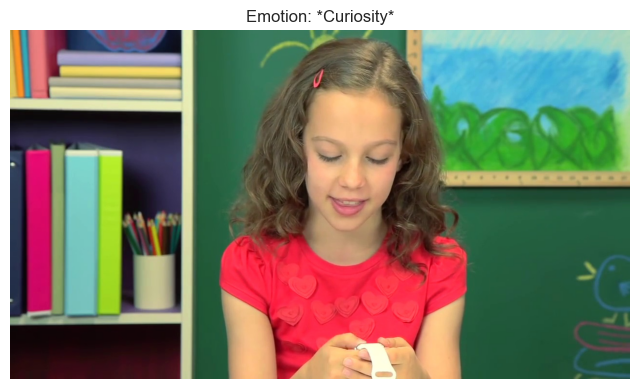

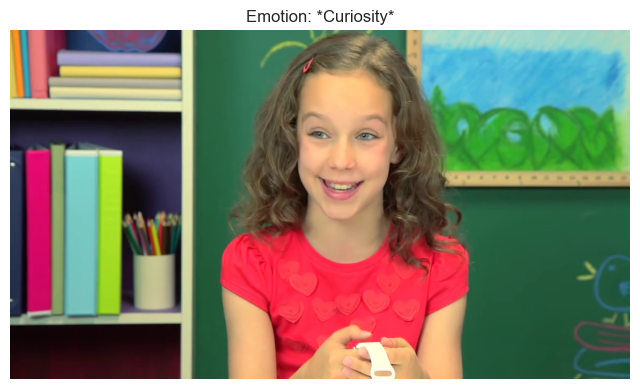

In [25]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Uncertainty

In [26]:
emotion_num = 1

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
12,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
17,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
21,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.0000,1
24,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
35,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
83,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.0000,1
121,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
143,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,2.6667,1
169,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,2.3333,1
204,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1


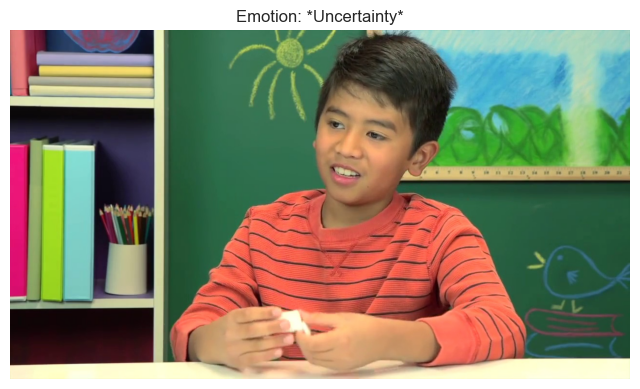

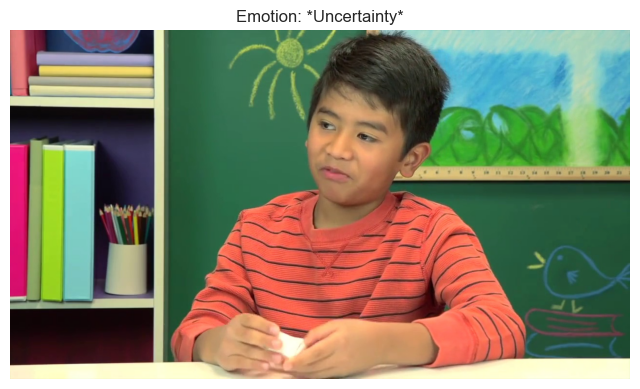

In [27]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Excitement

In [28]:
emotion_num = 2

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
48,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,0,1,1,0,0,2.0000,2
56,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,1,2.0000,2
81,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.0000,2
127,D:\Projects\masters_diploma\data\processed\Emo...,1,1,1,0,0,0,0,1,3.0000,2
137,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,0,1,0,0,0,4.6667,2
145,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,4.0000,2
157,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.3333,2
160,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,0,0,0,0,0,3.3333,2
180,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.6667,2
189,D:\Projects\masters_diploma\data\processed\Emo...,0,1,1,0,0,0,0,1,1.6667,2


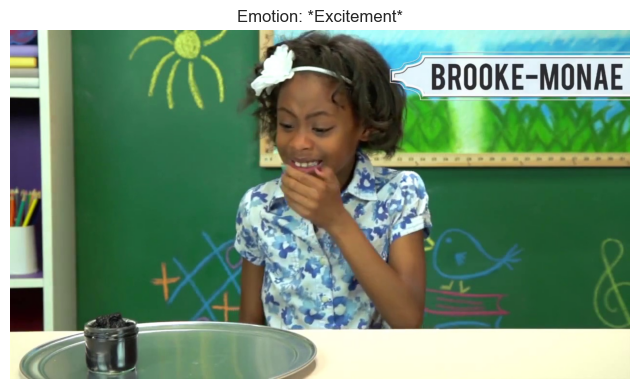

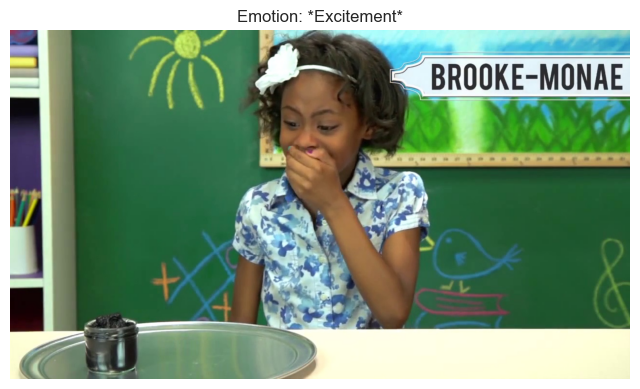

In [29]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Happiness

In [30]:
emotion_num = 3

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
2,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.6667,3
3,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.3333,3
5,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,1,0,0,0,6.6667,3
6,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.3333,3
7,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,5.6667,3
...,...,...,...,...,...,...,...,...,...,...,...
293,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,1,0,0,0,5.6667,3
294,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,1,0,0,1,5.0000,3
296,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,1,0,0,0,5.0000,3
298,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,1,0,0,0,0,4.6667,3


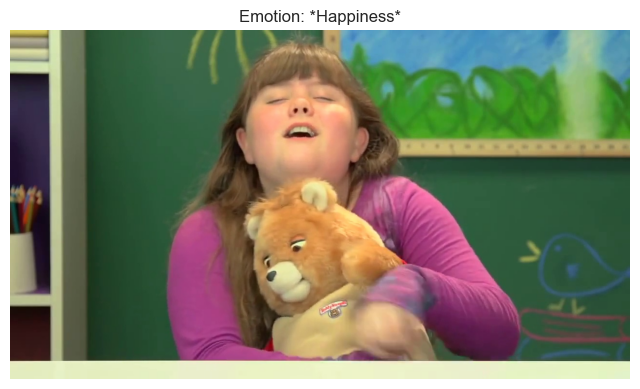

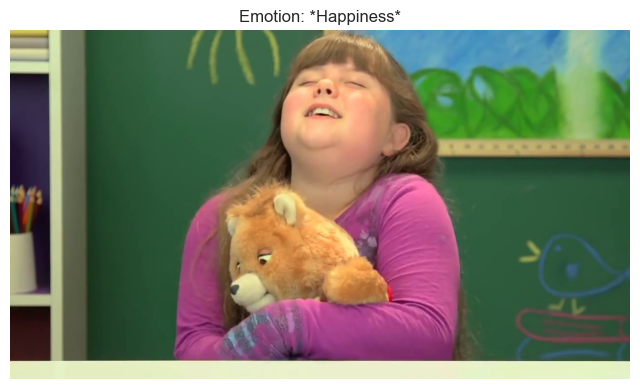

In [31]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Surprise

In [32]:
emotion_num = 4

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
0,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,3.6667,4
32,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,5.0000,4
39,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,3.6667,4
67,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,2.6667,4
123,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,0,4.6667,4
150,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,3.0000,4
163,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,2.3333,4
173,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,1.6667,4
206,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,4.0000,4
236,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,0,2.6667,4


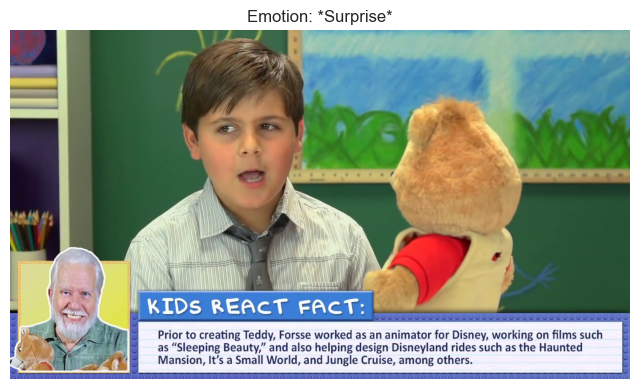

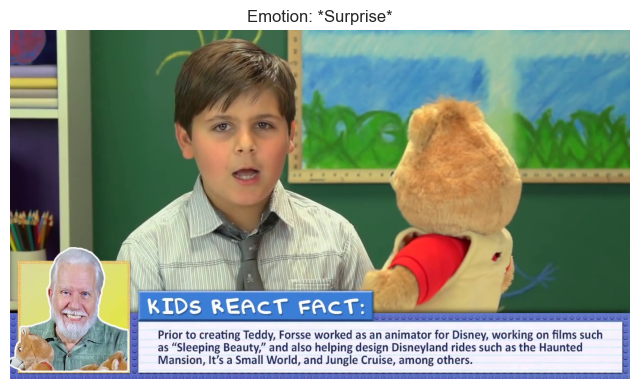

In [33]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Disgust

In [34]:
emotion_num = 5

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
14,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.0000,5
15,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,1,0,0,2.3333,5
45,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,1,0,0,2.6667,5
47,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,1,1,2.0000,5
59,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,1,1.6667,5
61,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.0000,5
62,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,1,1,0,2.0000,5
63,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,1,0,0,3.0000,5
64,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.3333,5
101,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,1,0,0,3.6667,5


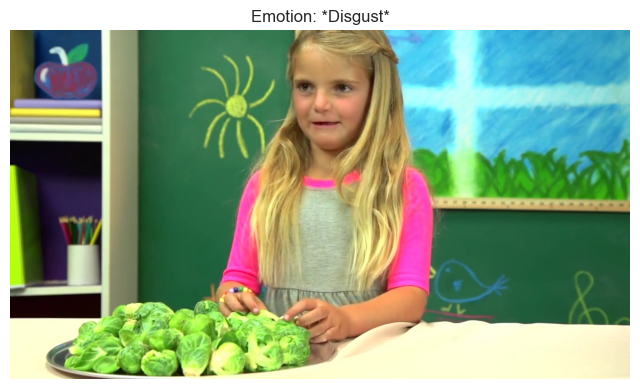

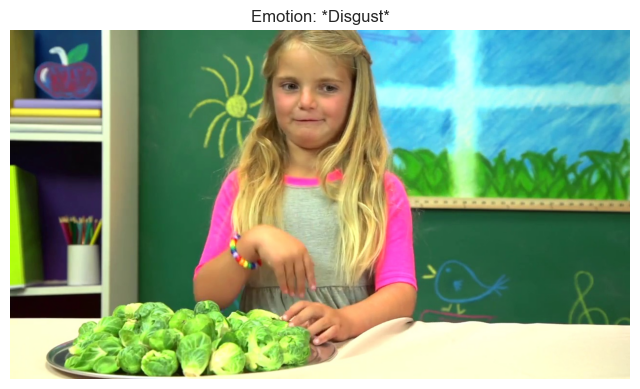

In [35]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Fear

In [36]:
emotion_num = 6

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
57,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,1,0,3.0000,6
99,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,1,0,3.0000,6
124,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,1,1,2.3333,6


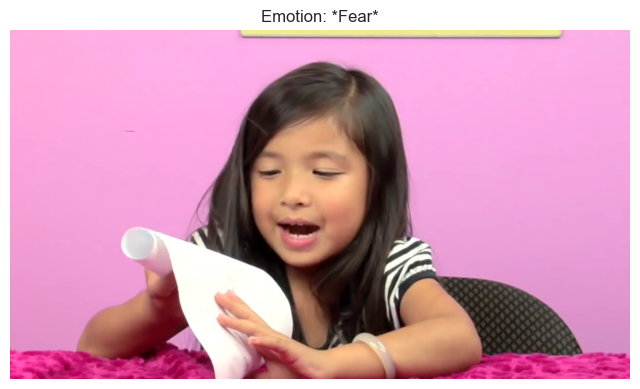

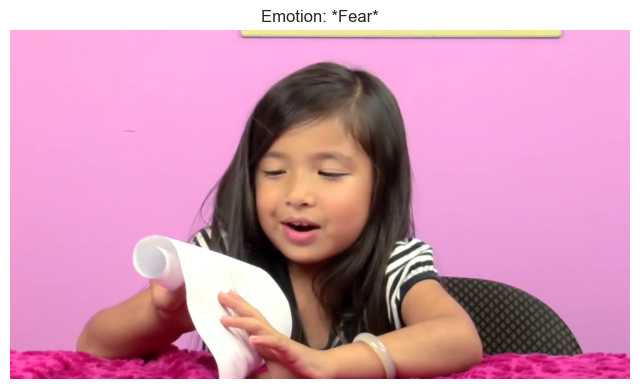

In [37]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Frustration

In [38]:
emotion_num = 7

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
89,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.3333,7
119,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,1,1.6667,7
129,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,2.3333,7
135,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,1,3.3333,7
142,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,2.6667,7
158,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,1,3.6667,7
168,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,1.6667,7
208,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.3333,7
222,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,0,0,1,2.6667,7
243,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,1,3.0000,7


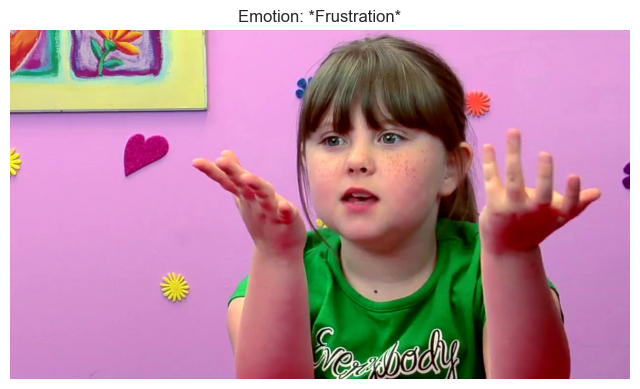

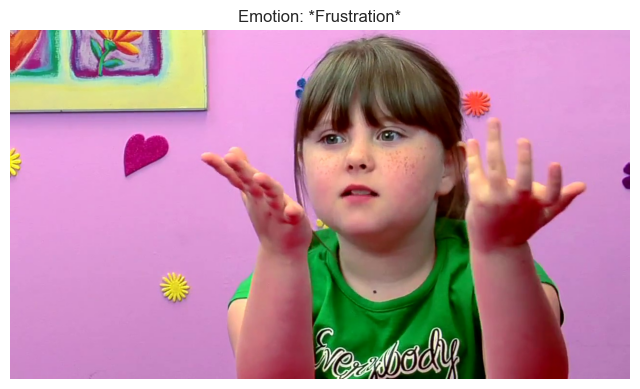

In [39]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

# Test analysis

In [40]:
dataset_name = "Test"
df = pd.read_csv(os.path.join(config["datasets_images"], "test.csv"))

# Drop cases, where there are no detected emotions
df = df[df.iloc[:, 1:-1].eq(1).any(axis=1)]

emotions_agg = []
for el_id in range(len(df.index)):
    _labels_list = np.array(df.iloc[el_id, 1:-1].values, dtype=int)
    _label = select_major_emotion(emotion_vector=_labels_list)
    emotions_agg.append(np.argmax(_label))

df["major_emotion"] = emotions_agg
df

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
1,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,5.6667,3
2,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,4.6667,3
3,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,1,0,0,0,0,3.3333,3
4,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,0,0,0,0,6.0000,3
5,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
362,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,1,0,0,0,6.3333,3
363,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.6667,0
364,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,1,0,0,0,0,5.3333,3
365,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.6667,3


### Curiosity

In [41]:
emotion_num = 0

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
22,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,3.0000,0
29,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.3333,0
51,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,2.6667,0
90,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.3333,0
92,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.3333,0
98,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,3.6667,0
105,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,0,4.3333,0
161,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.3333,0
200,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,3.3333,0
204,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,0,4.6667,0


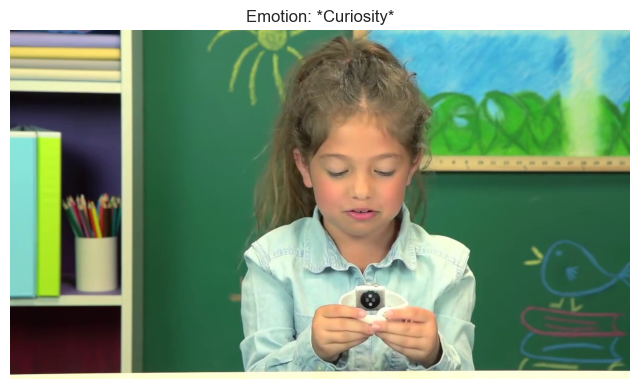

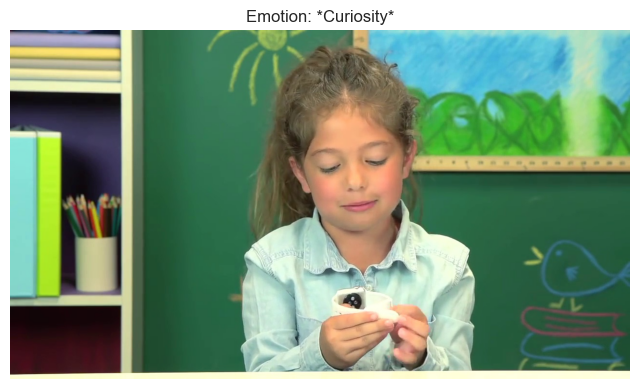

In [42]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Uncertainty

In [43]:
emotion_num = 1

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
42,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.0000,1
47,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
134,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.0000,1
135,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.0000,1
138,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,4.3333,1
224,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
225,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.6667,1
233,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.3333,1
234,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,3.0000,1
240,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,0,0,0,2.6667,1


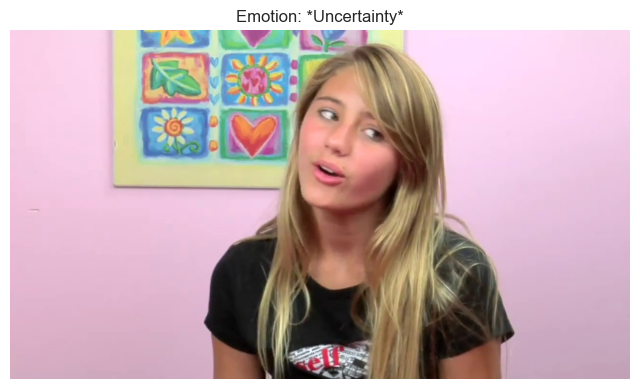

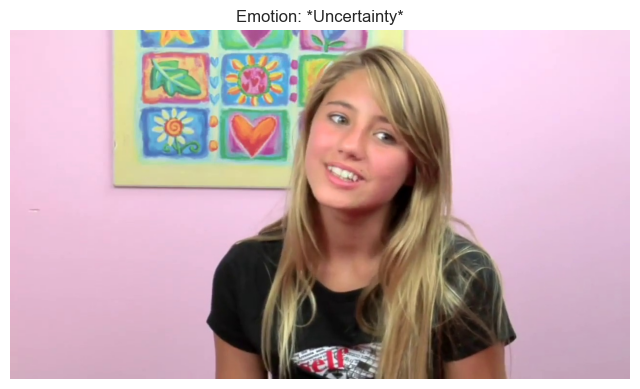

In [44]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Excitement

In [45]:
emotion_num = 2

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
6,D:\Projects\masters_diploma\data\processed\Emo...,0,1,1,0,1,0,1,0,3.3333,2
24,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.0000,2
45,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,2.3333,2
54,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,1,0,1,1.3333,2
63,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,1,0,0,2.6667,2
83,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,1,0,0,1.6667,2
91,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,1,0,0,2.6667,2
111,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.0000,2
116,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,3.6667,2
117,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,0,0,0,0,0,4.0000,2


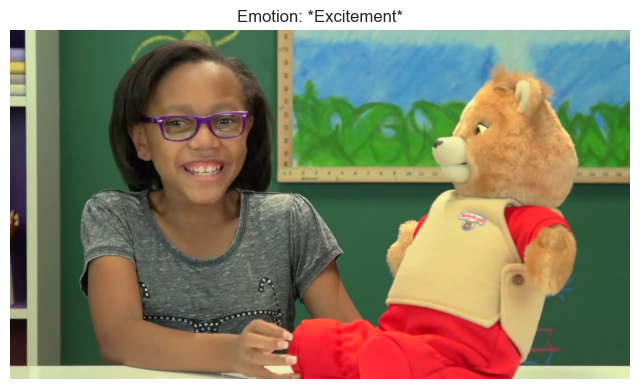

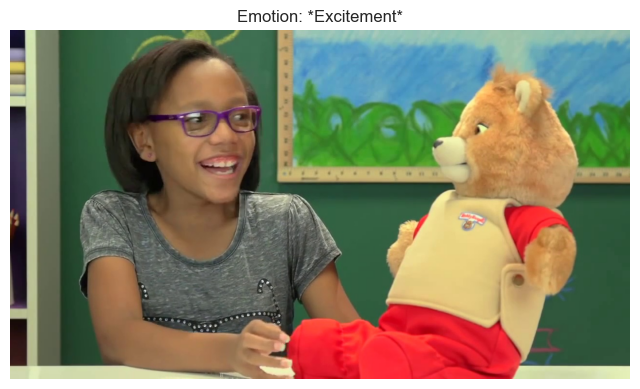

In [46]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Happiness

In [47]:
emotion_num = 3

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
1,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,5.6667,3
2,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,4.6667,3
3,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,1,0,0,0,0,3.3333,3
4,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,0,0,0,0,6.0000,3
5,D:\Projects\masters_diploma\data\processed\Emo...,0,0,1,1,0,0,0,0,6.0000,3
...,...,...,...,...,...,...,...,...,...,...,...
361,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,1,0,0,0,0,4.6667,3
362,D:\Projects\masters_diploma\data\processed\Emo...,1,0,1,1,1,0,0,0,6.3333,3
364,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,1,0,0,0,0,5.3333,3
365,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,1,0,0,0,0,4.6667,3


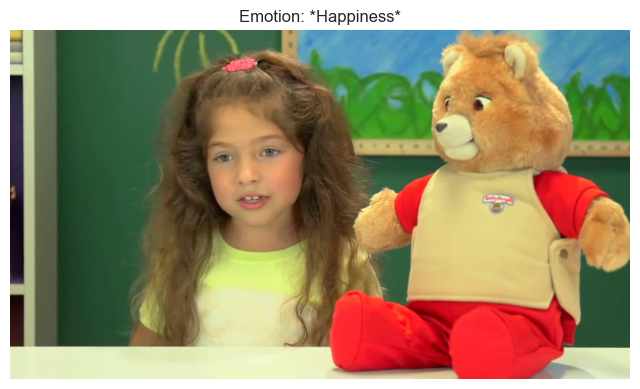

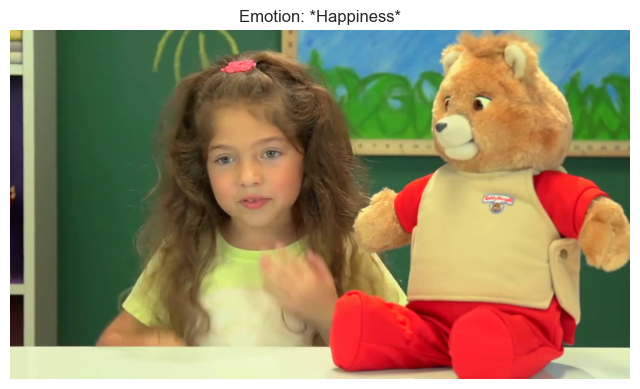

In [48]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Surprise

In [49]:
emotion_num = 4

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
19,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,2.0000,4
23,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,2.3333,4
26,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,4.3333,4
69,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,4.6667,4
107,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,4.3333,4
110,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,2.0000,4
113,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,0,3.0000,4
127,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,0,4.0000,4
128,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,3.6667,4
139,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,1,0,0,0,1.6667,4


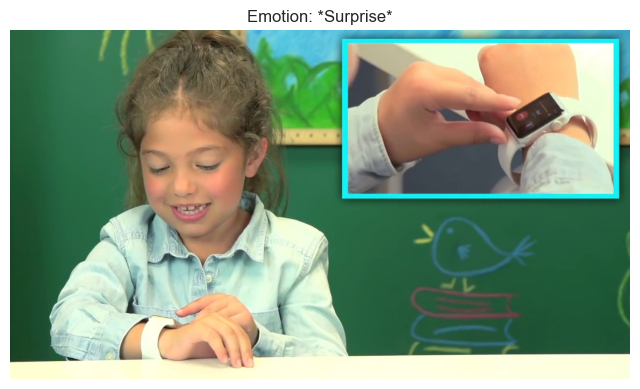

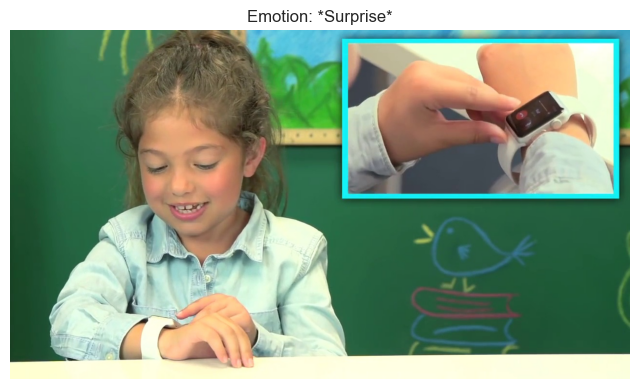

In [50]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Disgust

In [51]:
emotion_num = 5

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
31,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,2.6667,5
32,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,1,0,1.3333,5
33,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.3333,5
34,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,1,1,1,0,1.3333,5
35,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,1,1,0,1.6667,5
36,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.6667,5
38,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,4.0000,5
39,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,1,0,0,2.0000,5
52,D:\Projects\masters_diploma\data\processed\Emo...,0,1,0,0,0,1,1,0,2.3333,5
66,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,1,0,0,1.3333,5


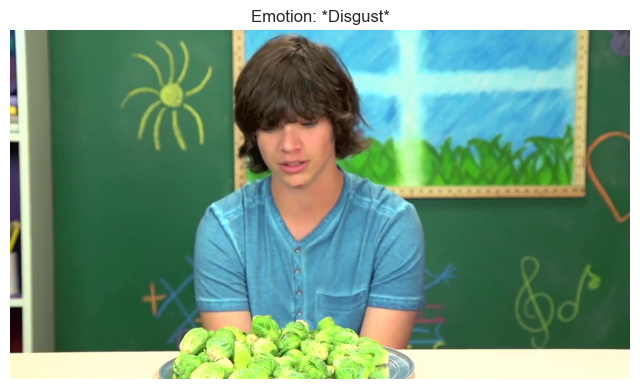

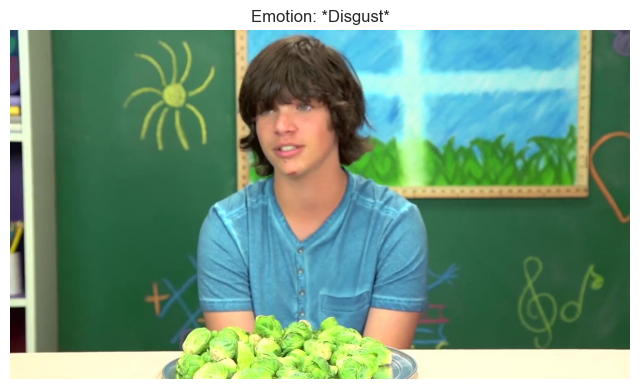

In [52]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Fear

In [53]:
emotion_num = 6

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
89,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,1,0,3.3333,6
215,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,1,0,3.3333,6
257,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,1,0,4.3333,6


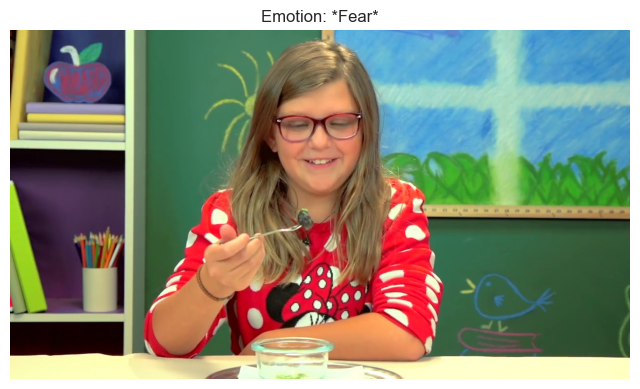

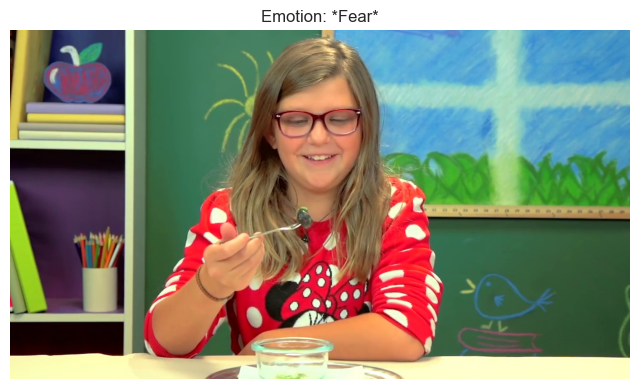

In [54]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])

### Frustration

In [55]:
emotion_num = 7

df_emotion = df[df["major_emotion"] == emotion_num]
df_emotion

,file_path,Curiosity,Uncertainty,Excitement,Happiness,Surprise,Disgust,Fear,Frustration,Valence,major_emotion
148,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,1,3.6667,7
193,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.6667,7
266,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,0,0,0,1,2.3333,7
270,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,1,3.0000,7
271,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,1,0,0,1,2.6667,7
272,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,2.3333,7
273,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.3333,7
283,D:\Projects\masters_diploma\data\processed\Emo...,1,0,0,0,1,0,0,1,2.0000,7
285,D:\Projects\masters_diploma\data\processed\Emo...,0,0,0,0,0,0,0,1,3.0000,7
286,D:\Projects\masters_diploma\data\processed\Emo...,1,1,0,0,0,0,0,1,3.0000,7


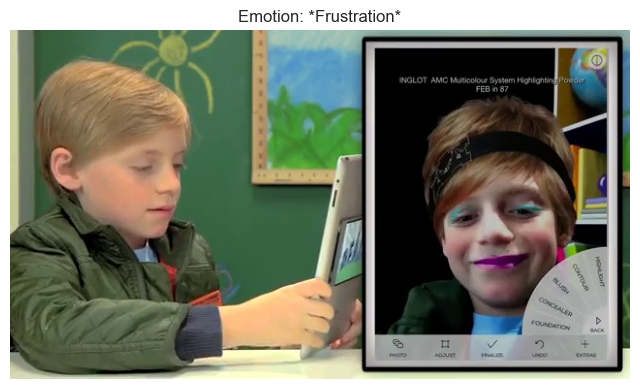

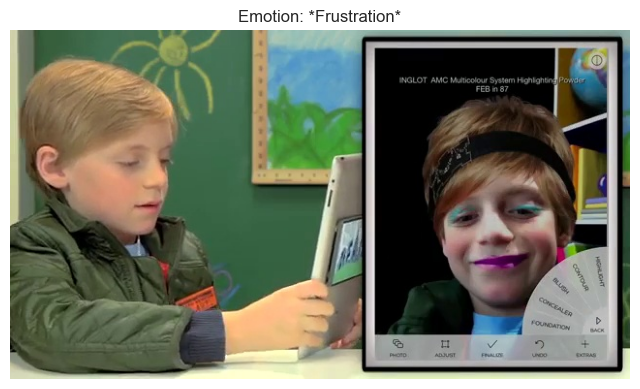

In [56]:
images_paths = natsorted(glob.glob(os.path.join(df_emotion["file_path"].to_list()[0], "*.jpg")))
visualize_emotion(images_paths[4], emotion_dict[emotion_num])
visualize_emotion(images_paths[5], emotion_dict[emotion_num])